# Synthetic pokemon TCG segmentation dataset

In [2]:
import sys
from pathlib import Path

notebook_dir = Path.cwd()
project_root = notebook_dir.parent.parent
sys.path.insert(0, str(project_root))

import matplotlib.pyplot as plt
import seaborn as sns
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import datetime
from database import PokemonTCGClient, CacheManager
from core.logging_config import setup_logger
from PIL import Image
import cv2
import albumentations as A
import random
from datasets import load_dataset
from tqdm.auto import tqdm
import json
import shutil
import ultralytics

# Configure plotting
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline
#configure matplotlib to show nicer images
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 100

print(f"Project root: {project_root}")
print(f"Python version: {sys.version}")
print("Setup complete!")

logger = setup_logger("notebook_01")
logger.info("Initializing Pokemon TCG client and cache manager...")
client = PokemonTCGClient()
cache = CacheManager()


Project root: /home/khalil/pkmn_card_detection
Python version: 3.10.12 (main, May 27 2025, 17:12:29) [GCC 11.4.0]
Setup complete!
2025-08-09 14:53:09 - notebook_01 - INFO - 1535623661.py:40 - Initializing Pokemon TCG client and cache manager...
2025-08-09 14:53:09 - database.api_client - INFO - api_client.py:52 - Pokemon TCG API client initialized
Absolute path: /home/khalil/pkmn_card_detection/ai-backend/notebooks/cache/cache.db
2025-08-09 14:53:09 - database.cache_manager - INFO - cache_manager.py:33 - Cache manager initialized with database: cache/cache.db


In [3]:
cards = cache.search_cards("pikachu")
logger.info(f"Found {len(cards)} cards")

sets = cache.search_sets("neo")
logger.info(f"Found {len(sets)} sets")

2025-08-09 14:56:51 - notebook_01 - INFO - 2904885017.py:2 - Found 173 cards
2025-08-09 14:56:51 - notebook_01 - INFO - 2904885017.py:5 - Found 4 sets


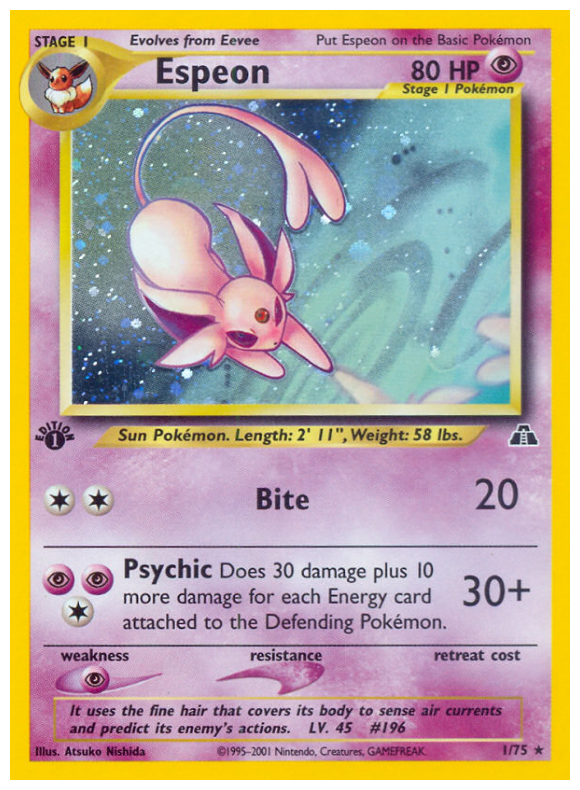

In [4]:
cards = cache.load_cards()
sets = cache.load_sets()

output_folder = "image_database"
if cards:
    img = cache.get_card_image(cards[0], Path(output_folder))
else:
    img = None

plt.imshow(np.array(img))
plt.axis("off")
plt.show()

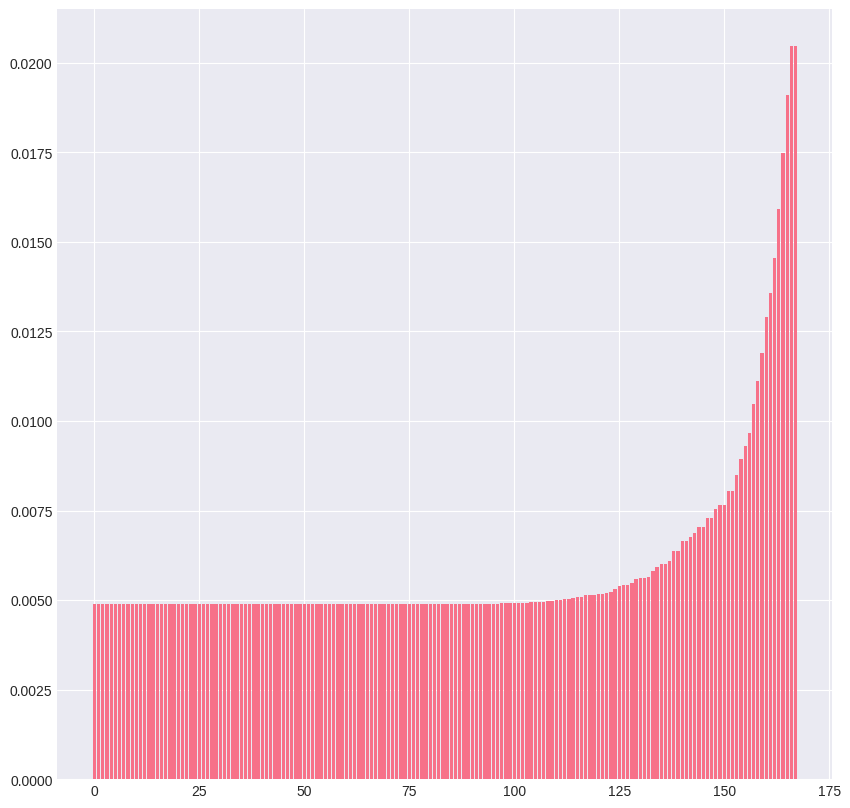

In [4]:
# assign a probability to each set based on the release date
import math
def compute_release_date_probs(sets, half_life_days=365):
    """
    Given a list of sets sorted by release_date, returns a list of
    (set, probability) tuples, where probability ∝ exp(–λ * age).
    """
    today = datetime.now().date()
    # parse their dates
    dates = [datetime.strptime(s.release_date, "%Y/%m/%d").date() for s in sets]
    ages = [(today - d).days for d in dates]

    # decay constant so weight halves every half_life_days
    λ = math.log(2) / half_life_days
    raw_weights = [0.3+math.exp(-λ * age) for age in ages]

    total = sum(raw_weights)
    probs = [w / total for w in raw_weights]

    return list(zip(sets, probs))

sets = cache.load_sets(sort_lambda=lambda s:datetime.strptime(s.release_date, "%Y/%m/%d").date())
sets_with_probs = compute_release_date_probs(sets)

#plot the probability of each set, with set name as the x-axis
plt.bar(range(len(sets_with_probs)), [p for s, p in sets_with_probs])
plt.show()


In [5]:
def pick_random_set(sets_with_probs):
    """
    Given a list of (set, probability) tuples, returns a random set
    according to the given probabilities.
    """
    return random.choices(sets_with_probs, k=1, weights=[p for _, p in sets_with_probs])[0][0]

def pick_random_card_from_set(set, n_cards=4):
    """
    Given a set, returns a random card from that set
    """
    _cards = cache.search_cards_by_set(set.id)
    if _cards is None or len(_cards) == 0:
        return None
    return random.choices(_cards, k=n_cards)

Next Destinies
Mewtwo-EX


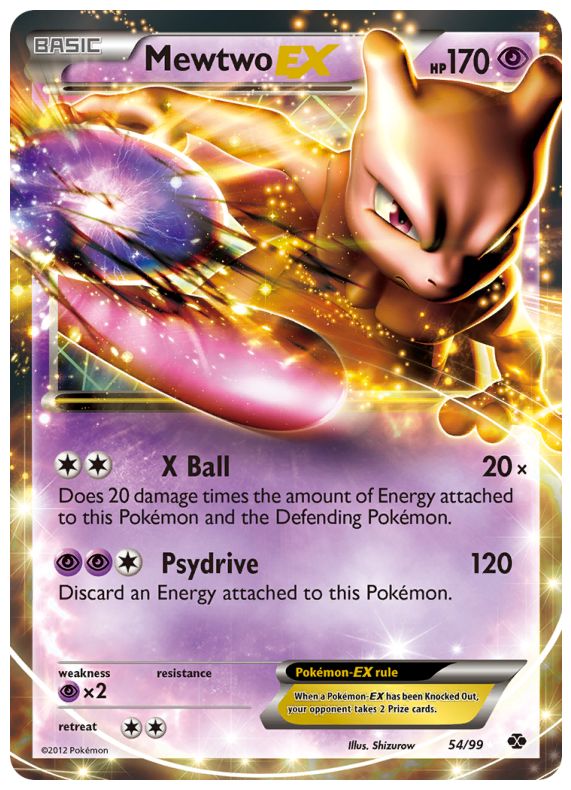

In [6]:
random_set = pick_random_set(sets_with_probs)
print(random_set.name)
#pick a random card from a random set
random_cards = pick_random_card_from_set(random_set)
print(random_cards[0].name)

#get the image and mask of the card
image = cache.get_card_image(random_cards[0], Path(output_folder))

#show the image and mask
plt.imshow(np.array(image))
plt.axis('off')
plt.show()

In [7]:
#cache.parallel_download_images(cards, output_folder) 

if not os.path.exists(output_folder):
    os.makedirs(output_folder)
else:
    if len(os.listdir(output_folder)) >= len(cards):
        print("All images are already downloaded")
        exit()

missing_cards = []
for card in cards:
    if not os.path.exists(os.path.join(output_folder, card.set.id, f"{card.id}.png")):
        missing_cards.append(card)
logger.info(f"Missing cards: {len(missing_cards)}")

# download the missing cards
for card in missing_cards:
    logger.info(f"Downloading card {card.set.id}/{card.id}")
    image = cache.get_card_image(card, Path(output_folder))

2025-08-09 13:22:11 - notebook_01 - INFO - 3141139305.py:14 - Missing cards: 0


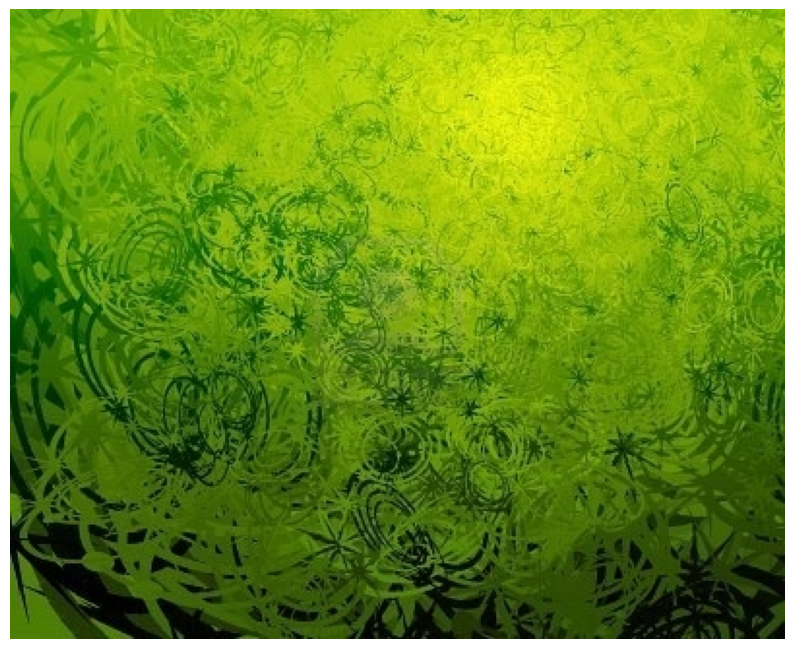

In [34]:
SPLIT        = "train"           # ~1,880 images total in this split
NUM_BG       = 1000               # how many backgrounds to download
BG_OUT_DIR      = "backgrounds"     

if not os.path.exists(BG_OUT_DIR) or len(os.listdir(BG_OUT_DIR)) < NUM_BG:
    ds = load_dataset("tanganke/dtd" , split=SPLIT)
    ds = ds.shuffle(seed=123).select(range(NUM_BG))
    os.makedirs(BG_OUT_DIR, exist_ok=True)

    for i, ex in enumerate(tqdm(ds, desc="Saving backgrounds")):
        img = ex["image"]  # a PIL.Image
        img.save(os.path.join(BG_OUT_DIR, f"dtd_bg_{i:04d}.png"))

    print(f"Downloaded {NUM_BG} backgrounds into ./{BG_OUT_DIR}/")

backgrounds = [Image.open(os.path.join(BG_OUT_DIR, f)) for f in os.listdir(BG_OUT_DIR)]

# show a random background
plt.imshow(np.array(backgrounds[random.randint(0, len(backgrounds) - 1)]))
plt.axis("off")
plt.show()

In [27]:
from pathlib import Path
import json

# Locate annotations dir (adjust if needed)
project_root = Path(".").resolve().parent.parent
ann_dir = project_root / "ai-backend" / "dataset_generation" / "annotations"

out_file = ann_dir / "instances.json"

# Collect all per-image COCO files: e.g., img_0001.json, img_0002.json, ...
# Exclude the merged output if it exists.
json_files = sorted(p for p in ann_dir.glob("*.json") if p.name != out_file.name)

merged = {
    "images": [],
    "annotations": [],
    "categories": [{"id": 1, "name": "card"}],
}

img_id_counter = 1
ann_id_counter = 1

for jf in json_files:
    with open(jf, "r", encoding="utf-8") as f:
        coco = json.load(f)

    # Many of your files have exactly one image, but support >1 just in case.
    old_to_new_img_id = {}

    for img in coco.get("images", []):
        new_img = dict(img)
        old_img_id = img.get("id", 1)
        new_img["id"] = img_id_counter
        old_to_new_img_id[old_img_id] = img_id_counter
        merged["images"].append(new_img)
        img_id_counter += 1

    for ann in coco.get("annotations", []):
        new_ann = dict(ann)
        new_ann["id"] = ann_id_counter
        # map to the new image id (default to last added if missing)
        old_img_id = ann.get("image_id", None)
        if old_img_id in old_to_new_img_id:
            new_ann["image_id"] = old_to_new_img_id[old_img_id]
        else:
            # fallback: attach to the most recent image we added for this file
            new_ann["image_id"] = img_id_counter - 1
        merged["annotations"].append(new_ann)
        ann_id_counter += 1

# Save merged COCO
with open(out_file, "w", encoding="utf-8") as f:
    json.dump(merged, f, ensure_ascii=False)

print(f"Merged {len(merged['images'])} images and {len(merged['annotations'])} anns into {out_file}")

Merged 5000 images and 50557 anns into /home/khalil/pkmn_card_detection/ai-backend/dataset_generation/annotations/instances.json


In [28]:
# split_coco_dataset.py
from pathlib import Path
import json
import random
import shutil
import os
from typing import Dict, List, Tuple, Set

ALLOWED_IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

def _ensure_dir(p: Path) -> None:
    p.mkdir(parents=True, exist_ok=True)

def _split_indices(n: int, split: Tuple[float, float, float]) -> Dict[str, List[int]]:
    a, b, c = split
    assert abs(a + b + c - 1.0) < 1e-6, "split must sum to 1.0"
    idxs = list(range(n))
    n_train = int(n * a)
    n_val   = int(n * b)
    return {
        "train": idxs[:n_train],
        "val":   idxs[n_train:n_train + n_val],
        "test":  idxs[n_train + n_val:]
    }

def _filter_coco(coco: dict, keep_img_ids: Set[int], new_file_names: Dict[int, str]) -> dict:
    images = []
    for im in coco.get("images", []):
        if im["id"] in keep_img_ids:
            j = dict(im)
            j["file_name"] = new_file_names[im["id"]]  # basename inside split dir
            images.append(j)
    anns = [ann for ann in coco.get("annotations", []) if ann["image_id"] in keep_img_ids]
    out = {
        "images": images,
        "annotations": anns,
        "categories": coco.get("categories", []),
    }
    for k in ("info", "licenses"):
        if k in coco:
            out[k] = coco[k]
    return out

def _resolve_source_path(img_root: Path, orig_file: str) -> Path:
    p = Path(orig_file)
    # Absolute path in COCO: use directly
    if p.is_absolute():
        return p
    # Try as relative to images root
    candidate = img_root / p
    if candidate.exists():
        return candidate
    # Try flattened basename under images/
    alt = img_root / p.name
    if alt.exists():
        return alt
    # If no suffix, try common image extensions
    if not p.suffix:
        for ext in ALLOWED_IMG_EXT:
            c1 = (img_root / p).with_suffix(ext)
            c2 = (img_root / p.name).with_suffix(ext)
            if c1.exists():
                return c1
            if c2.exists():
                return c2
    raise FileNotFoundError(f"Image not found for file_name='{orig_file}' under '{img_root}'")

def split_dataset_coco(
    dataset_gen_root: str | Path,
    dataset_root: str | Path,
    split=(0.8, 0.1, 0.1),
    seed: int = 42,
    move: bool = False,
    symlink: bool = False,
    source_json_name: str = "instances.json",
) -> Dict[str, Dict[str, int]]:
    """
    Split a COCO dataset into train/val/test.

    Input layout:
      dataset_gen_root/
        images/
        annotations/instances.json   (full COCO)

    Output layout:
      dataset_root/
        images/train/*, images/val/*, images/test/*
        annotations/instances_train.json, instances_val.json, instances_test.json
        dataset.yaml
    """
    root = Path(dataset_gen_root).resolve()
    img_root = root / "images"
    ann_root = root / "annotations"
    src_json = ann_root / source_json_name
    assert img_root.is_dir(), f"Missing folder: {img_root}"
    assert src_json.is_file(), f"Missing file: {src_json}"

    with src_json.open("r", encoding="utf-8") as f:
        coco = json.load(f)

    images = coco.get("images", [])
    assert images, "COCO file has no images"

    # Shuffle deterministically
    random.seed(seed)
    images_shuffled = images[:]
    random.shuffle(images_shuffled)
    splits = _split_indices(len(images_shuffled), split)

    # Prepare output dirs
    dataset_root = Path(dataset_root)
    out_train = dataset_root / "images" / "train"
    out_val   = dataset_root / "images" / "val"
    out_test  = dataset_root / "images" / "test"
    for d in (out_train, out_val, out_test):
        _ensure_dir(d)
    _ensure_dir(dataset_root / "annotations")

    def place(src: Path, dst: Path):
        _ensure_dir(dst.parent)
        if symlink:
            if dst.exists() or dst.is_symlink():
                dst.unlink()
            dst.symlink_to(src)
        elif move:
            shutil.move(str(src), str(dst))
        else:
            shutil.copy2(str(src), str(dst))

    id_to_image = {im["id"]: im for im in images_shuffled}
    def split_ids(name: str) -> List[int]:
        return [images_shuffled[i]["id"] for i in splits[name]]

    results = {}
    for split_name, out_dir in (("train", out_train), ("val", out_val), ("test", out_test)):
        keep_ids = set(split_ids(split_name))
        new_file_names: Dict[int, str] = {}
        missing = []

        for img_id in keep_ids:
            im = id_to_image[img_id]
            orig_file = im["file_name"]
            try:
                src_path = _resolve_source_path(img_root, orig_file)
            except FileNotFoundError:
                missing.append(orig_file)
                continue

            new_name = Path(orig_file).name  # flatten to basename
            dst_path = out_dir / new_name

            # Avoid collisions by appending image id
            if dst_path.exists():
                stem, suf = dst_path.stem, dst_path.suffix
                dst_path = out_dir / f"{stem}_{img_id}{suf}"
                new_name = dst_path.name

            place(src_path, dst_path)
            new_file_names[img_id] = new_name

        # Filter COCO to this split and write JSON
        split_coco = _filter_coco(coco, set(new_file_names.keys()), new_file_names)
        out_json = dataset_root / "annotations" / f"instances_{split_name}.json"
        with out_json.open("w", encoding="utf-8") as f:
            json.dump(split_coco, f, ensure_ascii=False)

        results[split_name] = {
            "num_images": len(split_coco["images"]),
            "num_annotations": len(split_coco.get("annotations", [])),
            "missing_files": len(missing),
        }
        if missing:
            print(f"[{split_name}] WARNING: {len(missing)} images referenced in COCO not found. Example: {missing[:3]}")

    # dataset.yaml for YOLO
    names = [c["name"] for c in coco.get("categories", [{"name": "card"}])]
    data_yaml = dataset_root / "dataset.yaml"
    with data_yaml.open("w", encoding="utf-8") as f:
        abs_root = dataset_root.resolve()
        f.write(f"path: {abs_root}\n")
        f.write("train: images/train\n")
        f.write("val: images/val\n")
        if results["test"]["num_images"] > 0:
            f.write("test: images/test\n")
        names_str = ", ".join([json.dumps(n) for n in names])
        f.write(f"names: [{names_str}]\n")

    print("=== DONE ===")
    for k, v in results.items():
        print(f"{k}: {v['num_images']} imgs, {v['num_annotations']} anns, missing={v['missing_files']}")
    print(f"dataset.yaml -> {data_yaml}")

    return results

# -------- run it (self-contained anchoring) --------
project_root = (Path(__file__).resolve().parent.parent if "__file__" in globals() else Path(".").resolve().parent.parent)
OUTPUT_DIR = project_root / "ai-backend" / "dataset_generation"
DATASET_OUT = project_root / "ai-backend" / "dataset"  # where split set will be written

split_dataset_coco(OUTPUT_DIR, DATASET_OUT, split=(0.8, 0.1, 0.1), seed=123)

=== DONE ===
train: 4000 imgs, 39810 anns, missing=0
val: 500 imgs, 5206 anns, missing=0
test: 500 imgs, 5541 anns, missing=0
dataset.yaml -> /home/khalil/pkmn_card_detection/ai-backend/dataset/dataset.yaml


{'train': {'num_images': 4000, 'num_annotations': 39810, 'missing_files': 0},
 'val': {'num_images': 500, 'num_annotations': 5206, 'missing_files': 0},
 'test': {'num_images': 500, 'num_annotations': 5541, 'missing_files': 0}}

In [29]:
# === Convert COCO splits to YOLO segmentation format ===
from pathlib import Path
import json

def coco_splits_to_yolo_seg(dataset_root: Path, splits=("train", "val", "test")):
    ann_root = dataset_root / "annotations"
    labels_root = dataset_root / "labels"
    labels_root.mkdir(parents=True, exist_ok=True)

    for split in splits:
        coco_json = ann_root / f"instances_{split}.json"
        if not coco_json.exists():
            continue

        with coco_json.open("r", encoding="utf-8") as f:
            coco = json.load(f)

        # maps for fast lookup
        id2img = {im["id"]: im for im in coco.get("images", [])}
        cat2cls = {cat["id"]: idx for idx, cat in enumerate(coco.get("categories", []))}

        split_labels_dir = labels_root / split
        split_labels_dir.mkdir(parents=True, exist_ok=True)

        # collect lines by image, then write once (avoids duplicate appends)
        lines_by_stem = {}

        for ann in coco.get("annotations", []):
            im = id2img.get(ann["image_id"])
            if not im:
                continue
            w, h = im.get("width"), im.get("height")
            if not w or not h:
                continue

            segs = ann.get("segmentation", [])
            if isinstance(segs, dict):
                # RLE (not polygons) -> skip
                continue

            cls_id = cat2cls.get(ann["category_id"], 0)
            stem = Path(im["file_name"]).stem

            for seg in segs:
                if not seg or len(seg) < 6:  # need at least 3 points
                    continue
                xs = seg[0::2]
                ys = seg[1::2]
                pts = []
                for x, y in zip(xs, ys):
                    xn = max(0.0, min(1.0, x / w))
                    yn = max(0.0, min(1.0, y / h))
                    pts.extend([xn, yn])

                line = str(cls_id) + " " + " ".join(f"{p:.6f}" for p in pts)
                lines_by_stem.setdefault(stem, []).append(line)

        # write (overwrite) each file once
        for stem, lines in lines_by_stem.items():
            with (split_labels_dir / f"{stem}.txt").open("w", encoding="utf-8") as lf:
                lf.write("\n".join(lines) + "\n")

# === Run conversion for train/val/test splits ===
# Use the SAME dataset_root you used in the split step
project_root = (Path(__file__).resolve().parent.parent if "__file__" in globals() else Path(".").resolve().parent.parent)
dataset_root = project_root / "ai-backend" / "dataset"  # <-- match your split destination
coco_splits_to_yolo_seg(dataset_root)
print("YOLO segmentation labels written under:", dataset_root / "labels")

YOLO segmentation labels written under: /home/khalil/pkmn_card_detection/ai-backend/dataset/labels


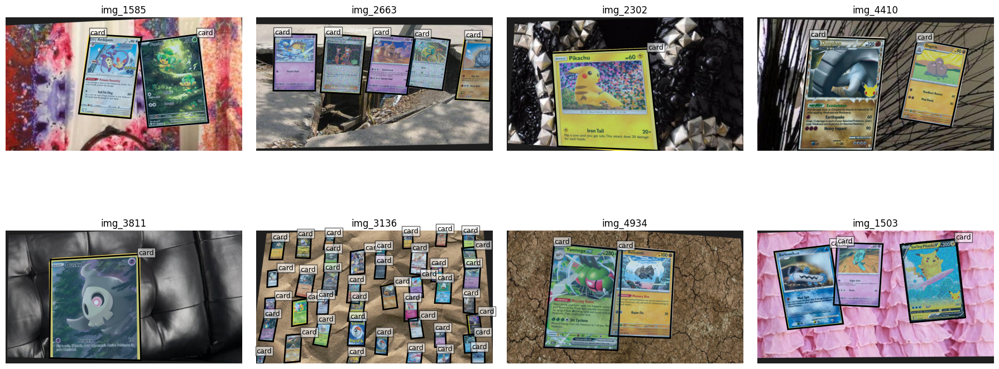

In [1]:
# Visualize random train images with YOLO segmentation overlays
from pathlib import Path
import random
from math import ceil
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from PIL import Image

# --- locate dataset root the same way as before ---
project_root = (Path(__file__).resolve().parent.parent if "__file__" in globals()
                else Path(".").resolve().parent.parent)
dataset_root = project_root / "ai-backend" / "dataset"   # <-- adjust if needed

img_dir = dataset_root / "images" / "train"
lab_dir = dataset_root / "labels" / "train"

assert img_dir.is_dir(), f"Missing {img_dir}"
assert lab_dir.is_dir(), f"Missing {lab_dir}"

# Optional class names from dataset.yaml (falls back to numeric IDs)
names = None
try:
    import yaml
    y = yaml.safe_load((dataset_root / "dataset.yaml").read_text())
    names = y.get("names")
except Exception:
    pass

def parse_yolo_seg(label_path: Path):
    """Return list of (cls_id, [(x1,y1), (x2,y2), ...]) in normalized coords."""
    polys = []
    if not label_path.exists(): 
        return polys
    for line in label_path.read_text().strip().splitlines():
        if not line.strip():
            continue
        parts = line.strip().split()
        try:
            cls = int(float(parts[0]))
        except Exception:
            continue
        nums = [float(p) for p in parts[1:]]
        if len(nums) < 6 or len(nums) % 2 != 0:
            continue  # need at least 3 points, even count
        pts = list(zip(nums[0::2], nums[1::2]))  # [(xn, yn), ...]
        polys.append((cls, pts))
    return polys

def denorm_polygon(pts_norm, w, h):
    """Clamp to [0,1] then scale to pixel coords."""
    out = []
    for xn, yn in pts_norm:
        x = max(0.0, min(1.0, xn)) * w
        y = max(0.0, min(1.0, yn)) * h
        out.append((x, y))
    return out

def visualize_random(n=8, seed=123, cols=4):
    random.seed(seed)
    # choose stems that actually have labels
    cand = []
    for p in img_dir.iterdir():
        if p.suffix.lower() not in {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}:
            continue
        stem = p.stem
        if (lab_dir / f"{stem}.txt").exists():
            cand.append(stem)
    if not cand:
        raise SystemExit("No labeled images found in train split.")
    sample = random.sample(cand, k=min(n, len(cand)))

    rows = ceil(len(sample) / cols)
    plt.figure(figsize=(cols * 4.5, rows * 4.5))

    for idx, stem in enumerate(sample, 1):
        img_path = next((p for p in (img_dir / f"{stem}").parent.glob(stem + ".*")
                         if p.is_file() and p.suffix.lower() in {".jpg",".jpeg",".png",".bmp",".webp",".tif",".tiff"}), None)
        if img_path is None:
            continue
        lbl_path = lab_dir / f"{stem}.txt"

        img = Image.open(img_path).convert("RGB")
        w, h = img.size
        polys = parse_yolo_seg(lbl_path)

        ax = plt.subplot(rows, cols, idx)
        ax.imshow(img)
        ax.set_axis_off()

        # draw polygons
        for cls, pts_norm in polys:
            pts = denorm_polygon(pts_norm, w, h)
            try:
                name = names[cls] if names and 0 <= cls < len(names) else str(cls)
            except Exception:
                name = str(cls)
            poly = Polygon(pts, closed=True, fill=True, alpha=0.25, linewidth=2)
            ax.add_patch(poly)
            # outline on top for visibility
            poly_edge = Polygon(pts, closed=True, fill=False, linewidth=2)
            ax.add_patch(poly_edge)
            # put a tiny label near first vertex
            x0, y0 = pts[0]
            ax.text(x0, y0, name, fontsize=9, bbox=dict(facecolor="white", alpha=0.6, pad=1.5))

        ax.set_title(stem)

    plt.tight_layout()
    plt.show()

# run it
visualize_random(n=8, seed=42, cols=4)


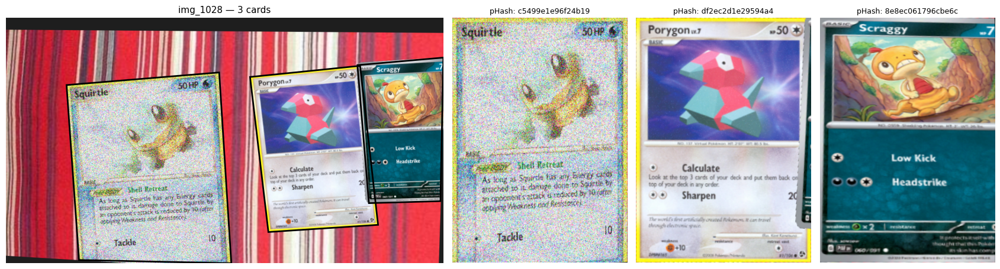

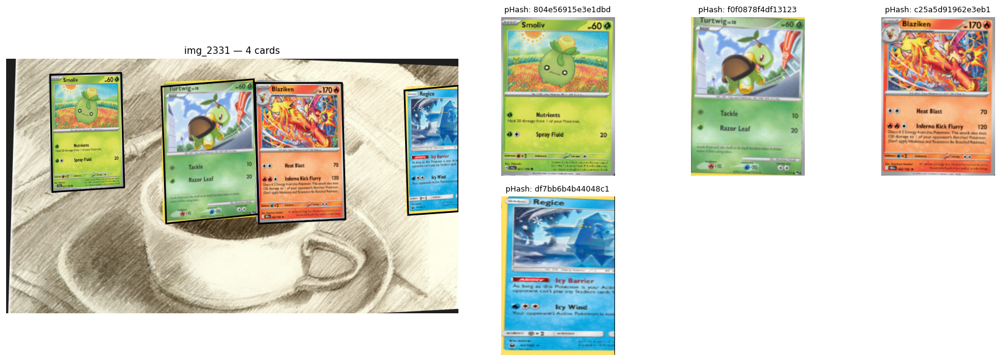

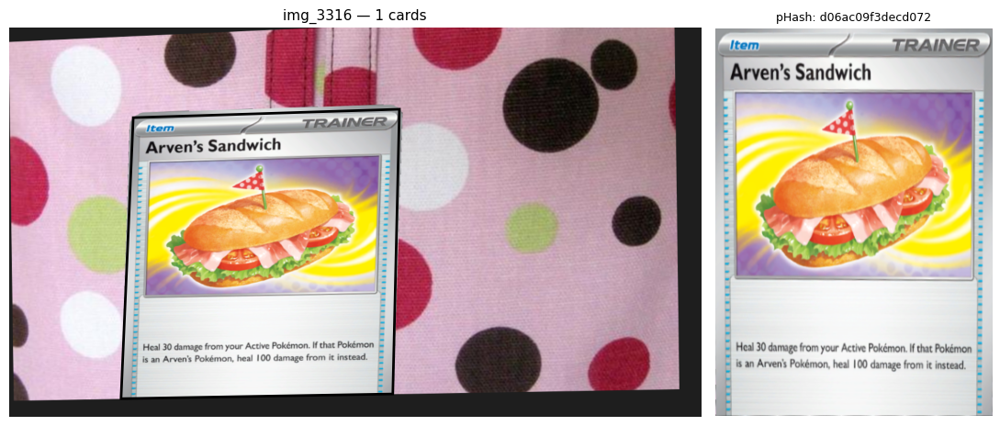

In [2]:
# Visualize random train images + rectified card crops with pHashes (no file I/O)
from pathlib import Path
from typing import List, Tuple
import random
import numpy as np
from PIL import Image
import imagehash
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import sys

# ---------- Path bootstrap: locate ../src/synthgen (or any ancestor/src/synthgen) ----------
def add_src_package_to_path(pkg: str = "synthgen", src_dir_name: str = "src") -> Path:
    here = Path(__file__).resolve().parent if "__file__" in globals() else Path.cwd()
    for p in (here, *here.parents):
        candidate = (p / src_dir_name / pkg).resolve()
        if candidate.is_dir():
            src_path = (p / src_dir_name).resolve()
            if str(src_path) not in sys.path:
                sys.path.insert(0, str(src_path))
            return src_path
    raise RuntimeError(f"Could not find '{src_dir_name}/{pkg}' above {here}")

add_src_package_to_path("synthgen", "src")
from synthgen.geom import rectify_card_from_poly

# ---- config ----
SPLIT = "train"        # which split to look at
NUM_IMAGES = 3         # how many images to visualize
MAX_CROPS = 6          # max rectified crops shown per image
RECT_W, RECT_H = 320, 448  # canonical rectified size

# locate dataset root consistently
project_root = (Path(__file__).resolve().parent.parent if "__file__" in globals()
                else Path(".").resolve().parent.parent)
dataset_root = project_root / "ai-backend" / "dataset"
img_dir = dataset_root / "images" / SPLIT
lab_dir = dataset_root / "labels" / SPLIT

EXT_OK = {".jpg",".jpeg",".png",".bmp",".webp",".tif",".tiff"}

def parse_yolo_seg(label_path: Path):
    """Return list of (cls_id, [(xn,yn), ...]) polygons from a YOLO .txt label file."""
    polys = []
    if not label_path.exists():
        return polys
    for line in label_path.read_text().strip().splitlines():
        parts = line.strip().split()
        if not parts:
            continue
        try:
            cls_id = int(float(parts[0]))
        except Exception:
            continue
        nums = [float(p) for p in parts[1:]]
        if len(nums) < 6 or len(nums) % 2 != 0:
            continue  # need ≥3 points and even count
        pts = list(zip(nums[0::2], nums[1::2]))  # normalized
        polys.append((cls_id, pts))
    return polys

def denorm_polygon(pts_norm: List[Tuple[float,float]], w: int, h: int) -> np.ndarray:
    """Clamp to [0,1], scale to pixel coords, return Nx2 float32."""
    arr = []
    for xn, yn in pts_norm:
        x = max(0.0, min(1.0, xn)) * w
        y = max(0.0, min(1.0, yn)) * h
        arr.append((x, y))
    return np.asarray(arr, dtype=np.float32)

def pil_to_rgb_np(im: Image.Image) -> np.ndarray:
    return np.array(im.convert("RGB"), dtype=np.uint8)

# pick images that have labels
stems = [p.stem for p in img_dir.iterdir()
         if p.suffix.lower() in EXT_OK and (lab_dir / f"{p.stem}.txt").exists()]
if not stems:
    raise SystemExit(f"No labeled images found in {img_dir}")
random.shuffle(stems)
stems = stems[:NUM_IMAGES]

for stem in stems:
    # load image + labels
    img_path = next((p for p in img_dir.glob(stem + ".*") if p.suffix.lower() in EXT_OK), None)
    if img_path is None:
        continue
    lbl_path = lab_dir / f"{stem}.txt"

    img_pil = Image.open(img_path).convert("RGB")
    W, H = img_pil.size
    polys_norm = parse_yolo_seg(lbl_path)

    # denorm + rectify
    rgb_np = pil_to_rgb_np(img_pil)
    crops = []  # list of (rectified_np, phash_str)
    polys_xy = []  # pixel polygons for overlay
    for cls_id, pts_norm in polys_norm[:MAX_CROPS]:
        poly_xy = denorm_polygon(pts_norm, W, H)  # Nx2
        polys_xy.append(poly_xy)
        rect = rectify_card_from_poly(rgb_np, poly_xy, (RECT_W, RECT_H))
        ph = imagehash.phash(Image.fromarray(rect))
        crops.append((rect, str(ph)))

    # figure: left = original with polygons, right = grid of crops with pHashes
    n_crops = len(crops)
    cols = max(1, min(3, n_crops))  # up to 3 crops per row
    rows = int(np.ceil(n_crops / cols)) if n_crops else 1
    fig_w = 8 + 3 * cols
    fig_h = max(6, 3 * rows)

    fig = plt.figure(figsize=(fig_w, fig_h))
    gs = fig.add_gridspec(nrows=rows, ncols=1 + cols, width_ratios=[2.5] + [1] * cols)

    # left panel: original with overlays
    ax0 = fig.add_subplot(gs[:, 0])  # span all rows
    ax0.imshow(img_pil)
    ax0.set_axis_off()
    ax0.set_title(f"{stem} — {n_crops} cards", fontsize=11)

    for poly in polys_xy:
        poly_disp = Polygon(poly, closed=True, fill=False, linewidth=2)
        ax0.add_patch(poly_disp)

    # right panels: crops with pHashes
    for k, (rect, ph) in enumerate(crops):
        r = k // cols
        c = (k % cols) + 1
        ax = fig.add_subplot(gs[r, c])
        ax.imshow(rect)
        ax.set_axis_off()
        ax.set_title(f"pHash: {ph}", fontsize=9)

    plt.tight_layout()
    plt.show()


Weights: /home/khalil/pkmn_card_detection/ai-backend/src/yolo11m-seg-trained.pt
Dataset root: /home/khalil/pkmn_card_detection/ai-backend/dataset
Ultralytics 8.3.176 🚀 Python-3.10.12 torch-2.8.0+cu128 CUDA:0 (NVIDIA GeForce RTX 5080, 16303MiB)
YOLO11m-seg summary (fused): 138 layers, 22,336,083 parameters, 0 gradients, 123.0 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 661.8±260.7 MB/s, size: 1269.2 KB)


val: Scanning /home/khalil/pkmn_card_detection/ai-backend/dataset/labels/test.cache... 468 images, 32 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   6%|▋         | 2/32 [00:00<00:11,  2.64it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  6.20it/s]


                   all        500       5541          1      0.999      0.995      0.986          1      0.999      0.995      0.922
Speed: 0.2ms preprocess, 3.5ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to /home/khalil/pkmn_card_detection/runs/segment/val6
[test] Seg mAP50-95: 0.9219 | mAP50: 0.9950 | mAP75: 0.9948


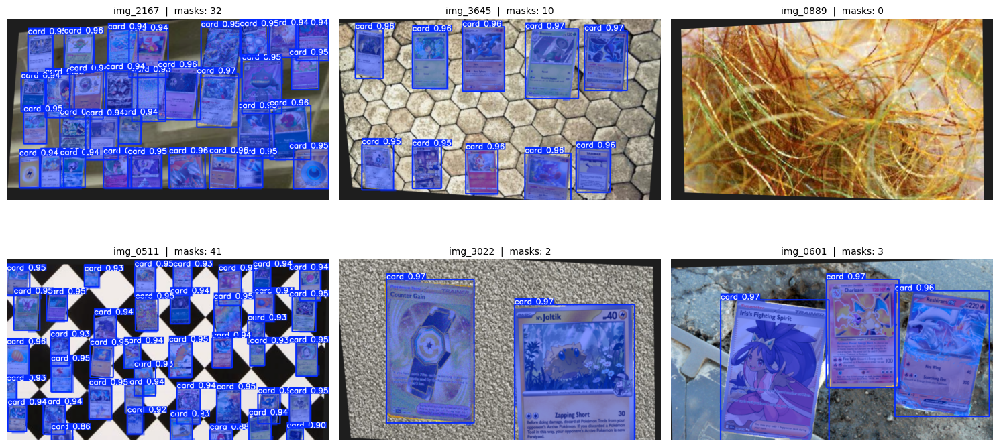

In [3]:
# Test YOLO-seg model: evaluate + visualize a few predictions (no file I/O)
from pathlib import Path
import random
import torch
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO

# --- paths relative to this notebook ---
HERE = Path(__file__).resolve().parent if "__file__" in globals() else Path.cwd()
BASE = (HERE / "..").resolve()  # points to ai-backend/

WEIGHTS = BASE / "src" / "yolo11m-seg-trained.pt"
DATASET_ROOT = BASE / "dataset"
DATA_YAML = DATASET_ROOT / "dataset.yaml"

print("Weights:", WEIGHTS)
print("Dataset root:", DATASET_ROOT)

assert WEIGHTS.is_file(), f"Missing weights: {WEIGHTS}"
assert DATA_YAML.is_file(), f"Missing dataset.yaml: {DATA_YAML}"

# choose split to evaluate/visualize
split = "test"
IMAGES_DIR = DATASET_ROOT / "images" / split

# --- device ---
DEVICE = 0 if torch.cuda.is_available() else "cpu"

# --- load model ---
model = YOLO(str(WEIGHTS))

# --- evaluate (segmentation metrics) ---
metrics = model.val(data=str(DATA_YAML), split=split, device=DEVICE, imgsz=640, verbose=False)
try:
    seg = metrics.seg
    print(f"[{split}] Seg mAP50-95: {seg.map:.4f} | mAP50: {seg.map50:.4f} | mAP75: {seg.map75:.4f}")
except Exception:
    print(f"[{split}] Metrics keys: {list(vars(metrics).keys())}")

# --- visualize a few predictions ---
exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}
paths = [p for p in (IMAGES_DIR.iterdir()) if p.suffix.lower() in exts]
assert paths, f"No images found in {IMAGES_DIR}"
sample = random.sample(paths, k=min(6, len(paths)))

results = model.predict(
    source=[str(p) for p in sample],
    device=DEVICE,
    imgsz=640,
    conf=0.25,
    iou=0.5,
    save=False,
    verbose=False
)

# plot results
cols = 3
rows = (len(results) + cols - 1) // cols
plt.figure(figsize=(cols * 5, rows * 4))

for i, (p, r) in enumerate(zip(sample, results), start=1):
    vis_bgr = r.plot()  # BGR np array
    vis_rgb = cv2.cvtColor(vis_bgr, cv2.COLOR_BGR2RGB)

    ax = plt.subplot(rows, cols, i)
    ax.imshow(vis_rgb)
    ax.axis("off")
    nmasks = 0 if getattr(r, "masks", None) is None else len(r.masks)
    ax.set_title(f"{p.stem}  |  masks: {nmasks}", fontsize=10)

plt.tight_layout()
plt.show()


Absolute path: /home/khalil/pkmn_card_detection/ai-backend/src/cache/cache.db
2025-08-10 16:11:16 - database.cache_manager - INFO - cache_manager.py:37 - Cache manager initialized with database: /home/khalil/pkmn_card_detection/ai-backend/src/cache/cache.db
2025-08-10 16:11:16 - database.cache_manager - INFO - cache_manager.py:423 - Building pHash index for /home/khalil/pkmn_card_detection/ai-backend/src/image_database
2025-08-10 16:11:16 - database.cache_manager - INFO - cache_manager.py:510 - pHash index complete. Rehashed 0 images (skipped 19465 up-to-date, updated 0).


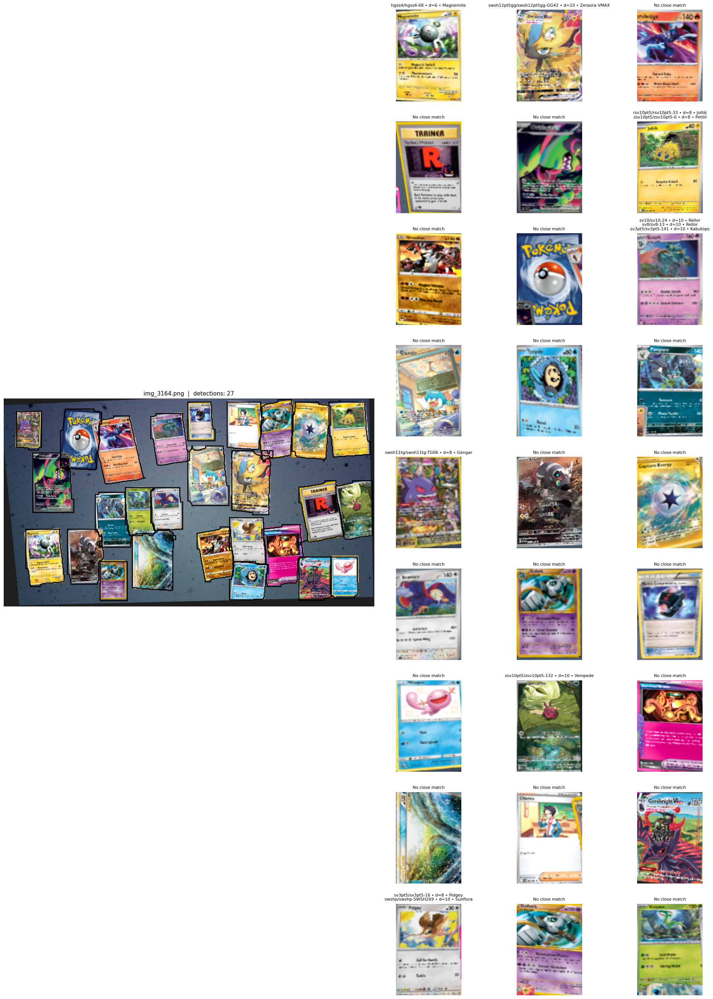

In [11]:
# One-shot: run YOLO-seg on a random test image, rectify crops, pHash match, visualize only
from pathlib import Path
import sys, random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import cv2
import torch

# --- repo paths (notebook in ai-backend/notebooks) ---
HERE = Path(__file__).resolve().parent if "__file__" in globals() else Path.cwd()
BASE = (HERE / "..").resolve()  # -> ai-backend/

# make local packages importable
SRC = BASE / "src"
if str(SRC) not in sys.path:
    sys.path.insert(0, str(SRC))

# weights + dataset
WEIGHTS = SRC / "yolo11m-seg-trained.pt"
DATASET_ROOT = BASE / "dataset"

assert WEIGHTS.is_file(), f"Missing weights: {WEIGHTS}"
assert (DATASET_ROOT / "dataset.yaml").is_file(), f"Missing dataset.yaml in {DATASET_ROOT}"

# --- imports from your repo ---
from ultralytics import YOLO
from synthgen.geom import rectify_card_from_poly_quadwise
from database.cache_manager import CacheManager  # uses your SQLite + pHash helpers

# --- choose split and random image ---
split = "test" if (DATASET_ROOT / "images" / "test").exists() else (
        "val" if (DATASET_ROOT / "images" / "val").exists() else "train")
IMG_DIR = DATASET_ROOT / "images" / split
LBL_DIR = DATASET_ROOT / "labels" / split

exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}
candidates = [p for p in IMG_DIR.iterdir() if p.suffix.lower() in exts]
assert candidates, f"No images found in {IMG_DIR}"
img_path = random.choice(candidates)

# --- load model & cache (for pHash) ---
DEVICE = 0 if torch.cuda.is_available() else "cpu"
model = YOLO(str(WEIGHTS))

# CacheManager: point to your existing cache dir and image DB (for index)
CACHE_DIR = SRC / "cache"
IMG_DB    = SRC / "image_database"
cache = CacheManager(CACHE_DIR)
# index is incremental; if already built it will be quick
cache.build_phash_index(IMG_DB, skip_unchanged=True, remove_stale=False)

# --- inference ---
res = model.predict(source=str(img_path), device=DEVICE, imgsz=640, conf=0.25, iou=0.5,
                    save=False, verbose=False)[0]

# Load original image
img_pil = Image.open(img_path).convert("RGB")
img_np  = np.array(img_pil)
H, W = img_np.shape[:2]

# --- collect polygons (pixel coords) ---
polys_xy = []
if getattr(res, "masks", None) is not None and getattr(res.masks, "xy", None) is not None:
    for poly in res.masks.xy:
        if poly is None or len(poly) < 3:
            continue
        # poly is Nx2 in pixel coords (float)
        polys_xy.append(np.asarray(poly, dtype=np.float32))
elif getattr(res, "boxes", None) is not None and getattr(res.boxes, "xyxy", None) is not None:
    # fallback to boxes -> quad
    for (x1, y1, x2, y2) in res.boxes.xyxy.cpu().numpy():
        quad = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]], dtype=np.float32)
        polys_xy.append(quad)

# --- rectify + pHash lookup ---
RECT_W, RECT_H = 320, 448
crops = []  # list of dicts per detection
for k, poly in enumerate(polys_xy, 1):
    rect = rectify_card_from_poly_quadwise(
        img_np, poly,
        out_size=(RECT_W, RECT_H),
        base_inset=0.012,                 # start here
        inset_range=(0.008, 0.035)        # tighten if masks are loose
    )
    crop_pil = Image.fromarray(rect)
    hits = cache.phash_lookup(
        crop_pil,              # PIL.Image
        max_distance=10,       # tighten/loosen as needed
        min_band_matches=2,
        limit=5
    )
    # attach human-readable name if available
    for h in hits:
        try:
            name = cache.search_cards_by_id(h["card_id"])[0].name
        except Exception:
            name = "?"
        h["name"] = name
    crops.append({"rect": rect, "hits": hits})

# --- visualize: left original with polygons, right grid of crops + matches ---
n = len(crops)
cols = max(1, min(3, n))
rows = max(1, int(np.ceil(n / cols)))
fig_w = 8 + 4 * cols
fig_h = max(6, 3 * rows)

fig = plt.figure(figsize=(fig_w, fig_h))
gs = fig.add_gridspec(nrows=rows, ncols=1 + cols, width_ratios=[2.8] + [1] * cols)

# left panel
ax0 = fig.add_subplot(gs[:, 0])
ax0.imshow(img_pil)
ax0.axis("off")
ax0.set_title(f"{img_path.name}  |  detections: {n}", fontsize=11)

for poly in polys_xy:
    ax0.add_patch(Polygon(poly, closed=True, fill=False, linewidth=2))

# right panels
for i, item in enumerate(crops):
    r = i // cols
    c = (i % cols) + 1
    ax = fig.add_subplot(gs[r, c])
    ax.imshow(item["rect"])
    ax.axis("off")
    # top-3 matches
    lines = []
    for h in item["hits"][:3]:
        lines.append(f"{h['set_id']}/{h['card_id']} • d={h['distance']} • {h.get('name','?')}")
    ax.set_title("\n".join(lines) if lines else "No close match", fontsize=8)

plt.tight_layout()
plt.show()

